In [1]:
from sympy import * 
import numpy as np
from scipy import linalg
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
import plotly.graph_objects as go
init_printing() 

### Dynamical Systems Section

In [2]:
# Constants
m = 0.695 # mass of the quadrotor 
Ixx = 0.00405068  
Iyy = 0.00405068 # moment of inertias of quadrotor 
Izz = 0.00781016  
g = 9.81 # gravitational constant

In [3]:
# Variables
px_W, py_W, pz_W = symbols('p_x, p_y, p_z')                             # position in world frame
vx_B, vy_B, vz_B = symbols('v_x, v_y, v_z')                             # velocity in body frame
phi, theta, psi = symbols('phi, theta, psi')                            # roll (phi), pitch (theta), and yaw (psi) angles
wx_B, wy_B, wz_B = symbols('omega_x, omega_y, omega_z')                 # angular velocities in body frame
taux_B, tauy_B, tauz_B, fz_B = symbols('tau_x, tau_y, tau_z, f_z')      # torques and net z-force in body frame

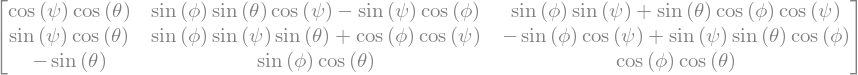

In [4]:
# Vectors, Matrices, Transformations
p_W = Matrix([[px_W],[py_W], [pz_W]]) 
v_B = Matrix([[vx_B],[vy_B],[vz_B]]) # creation of position, velocity, angular velocity vectors
w_B = Matrix([[wx_B],[wy_B], [wz_B]])
Rx = Matrix([[1,0,0],[0,cos(phi),-sin(phi)],[0,sin(phi),cos(phi)]])
Ry = Matrix([[cos(theta),0,sin(theta)],[0,1,0],[-sin(theta),0,cos(theta)]]) # rotation matrices
Rz = Matrix([[cos(psi),-sin(psi),0],[sin(psi),cos(psi),0],[0,0,1]])

R_BW = Rz@Ry@Rx # converts body to world (drone to inertial)
R_WB = Rx@Ry@Rz # converts world to body (inertial to drone)

tau_B = Matrix([[taux_B],[tauy_B],[tauz_B]]) # net torque vector
tau_B = simplify(tau_B)          

g_W = Matrix([[0.],[0.],[-m*g]]) # gravity in world
g_B = R_WB@g_W                   # gravity in body

f_B = g_B + Matrix([[0.],[0.],[fz_B]]) # net force vector in body

I_B = Matrix([[Ixx,0.,0.],[0.,Iyy,0.],[0.,0.,Izz]]) # moment of inertia matrix

R_BW

In [5]:
# px, py, pz rates
v_W = R_BW@v_B # xdot

In [6]:
# vx, vy vz rates
v_B_dot = (1/m)*(f_B - w_B.cross(m*v_B)) # Newton's 2nd Law

In [7]:
# phi, theta, psi rates
ex = Matrix([[1], [0], [0]])
ey = Matrix([[0], [1], [0]])
ez = Matrix([[0], [0], [1]])
M = Matrix.hstack(ex, Rx.T@ey, (Ry@Rx).T@ez)
rpy_dot = (M.inv())@w_B # angles

In [8]:
# angular velocity rates
w_B_dot = I_B.inv() @ (tau_B - w_B.cross(I_B@w_B)) # Euler's equation

In [9]:
# Assembles all differential equations
f = Matrix.vstack(v_W,
                  v_B_dot,
                  rpy_dot,
                  w_B_dot)
f = simplify(f,full=True)

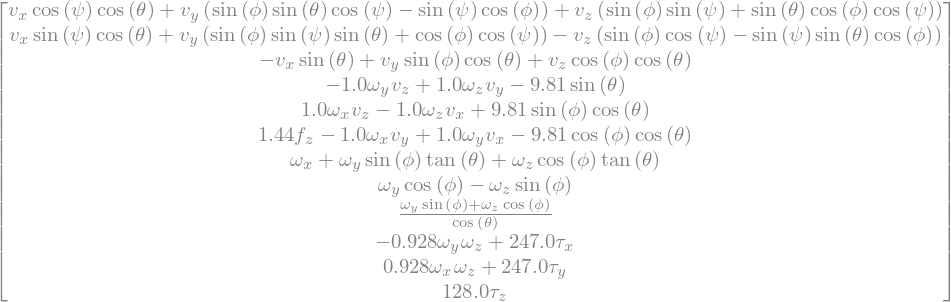

In [10]:
N(f,3)

The equations of motion for the dynamic model are now in the form:

$$\begin{bmatrix} \dot{p_x} \\ \dot{p_y} \\ \dot{p_z} \\ \dot{v_x} \\ \dot{v_y} \\ \dot{v_z} \\ \dot{\phi} \\ \dot{\theta} \\ \dot{\psi} \\ \dot{\omega_x} \\ \dot{\omega_y} \\ \dot{\omega_z} \end{bmatrix}=f\left(p_x, p_y, p_z, v_x, v_y, v_z, \phi, \theta, \psi, \omega_x, \omega_y, \omega_z, \tau_x, \tau_y, \tau_z, f_z\right)$$

### Control Systems Section

In [11]:
# equilibrium points
px_e = py_e = pz_e = vx_e = vy_e = vz_e = phi_e = theta_e = psi_e = omegax_e = omegay_e = omegaz_e = taux_e = tauy_e = tauz_e = 0.
fz_e = 9.81/1.43884892086331

m_e = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
n_e = np.array([0, 0, 0, 0])

# Checks if the function value when plugging the equilibrium points equals to 0
f_num = lambdify([px_W, py_W, pz_W, vx_B, vy_B, vz_B, phi, theta, psi, wx_B, wy_B, wz_B, taux_B, tauy_B, tauz_B, fz_B], f)
f_eq = f_num(px_e, py_e, pz_e, vx_e, vy_e, vz_e, phi_e, theta_e, psi_e, omegax_e, omegay_e, omegaz_e, taux_e, tauy_e, tauz_e, fz_e)
Matrix(f_eq)

In [12]:
# Coefficient Matrix A
A = lambdify([px_W, py_W, pz_W, vx_B, vy_B, vz_B, phi, theta, psi, wx_B, wy_B, wz_B, taux_B, tauy_B, tauz_B, fz_B], 
                 f.jacobian([px_W, py_W, pz_W, vx_B, vy_B, vz_B, phi, theta, psi, wx_B, wy_B, wz_B]))
A_num = A(px_e, py_e, pz_e, vx_e, vy_e, vz_e, phi_e, theta_e, psi_e, omegax_e, omegay_e, omegaz_e, taux_e, tauy_e, tauz_e, fz_e)

# Coefficient Matrix B
B = lambdify([px_W, py_W, pz_W, vx_B, vy_B, vz_B, phi, theta, psi, wx_B, wy_B, wz_B, taux_B, tauy_B, tauz_B, fz_B], 
                 f.jacobian([taux_B, tauy_B, tauz_B, fz_B]))
B_num = B(px_e, py_e, pz_e, vx_e, vy_e, vz_e, phi_e, theta_e, psi_e, omegax_e, omegay_e, omegaz_e, taux_e, tauy_e, tauz_e, fz_e)

In [13]:
# LQR Method for finding Gains Matrix
Q = np.diag([10, 100000, 10, 1, 1, 1, 1, 1, 1, 1, 1, 1])
R = np.diag([10, 10, 10, 10])

P = linalg.solve_continuous_are(A_num, B_num, Q, R)
K = linalg.inv(R) @ B_num.T @ P

### Performance Goals

#### Test 1

In [14]:
# Initial conditions
initial_conditions = np.array([0,0,0,0,0,0,0,0,0,0,0,0])

# Hover test
def hover(t, x):
    x_des = np.array([[0,0,1,0,0,0,0,0,0,0,0,9.81*0.695]])
    x_act = (x - x_des).T
    u = -K@x_act # control inputs
    dx_act = A_num@x_act + B_num@u # state-space form
    return dx_act.flatten()
    
# Time span 
t_span = (0, 120) # 2 minutes

# Integrate using solve_ivp
solution = solve_ivp(hover, t_span, initial_conditions, method='RK45', dense_output=False)

# Extract the state vs. time
x_actual_traj = solution.y[:12, :]
x_actual_traj = np.around(x_actual_traj, decimals=4)

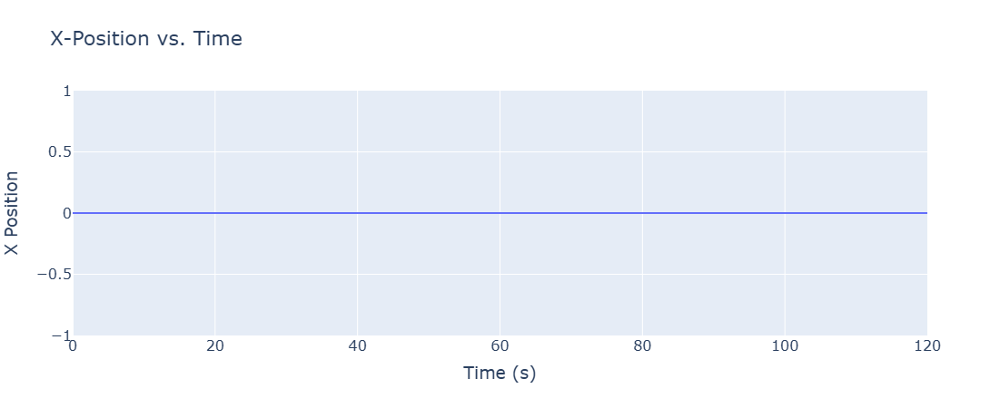

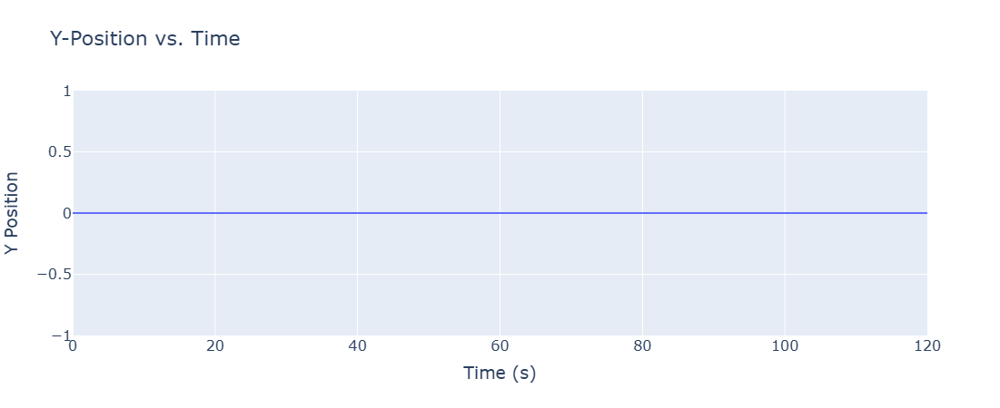

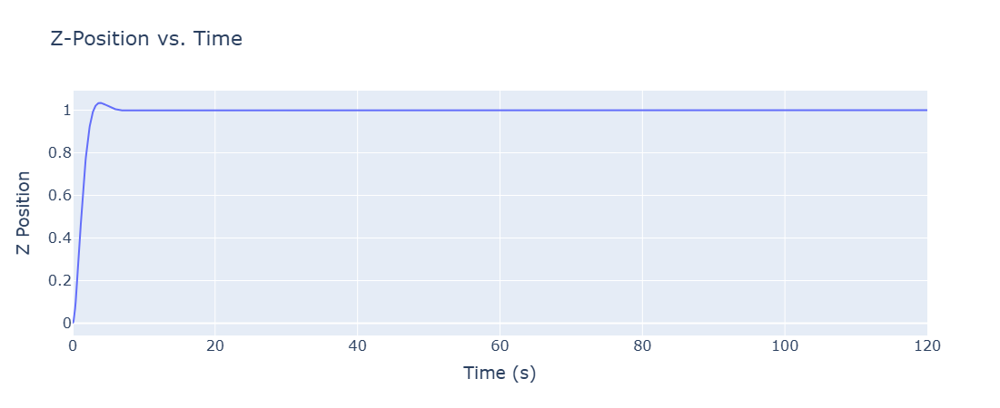

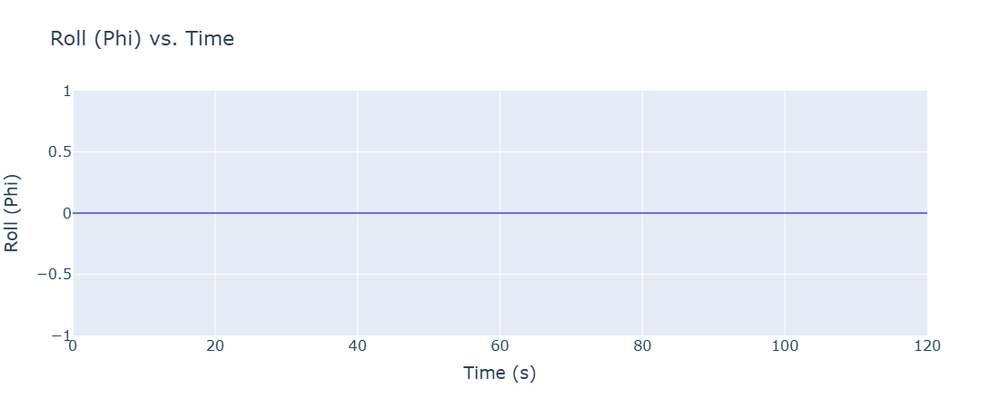

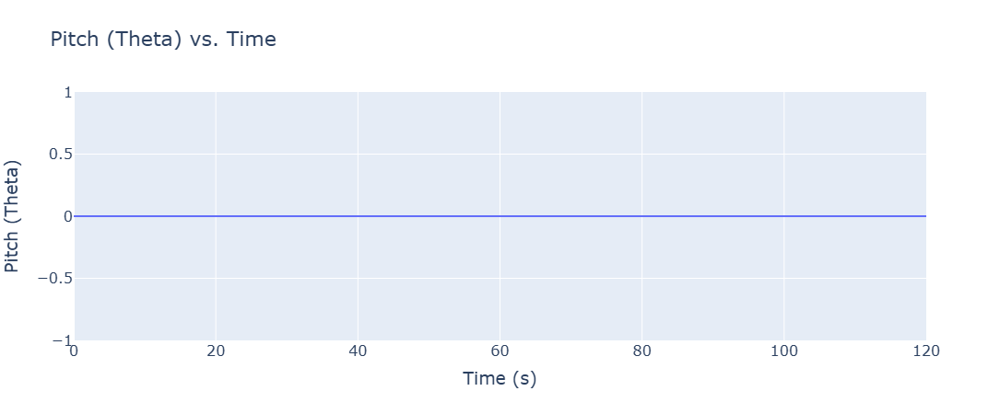

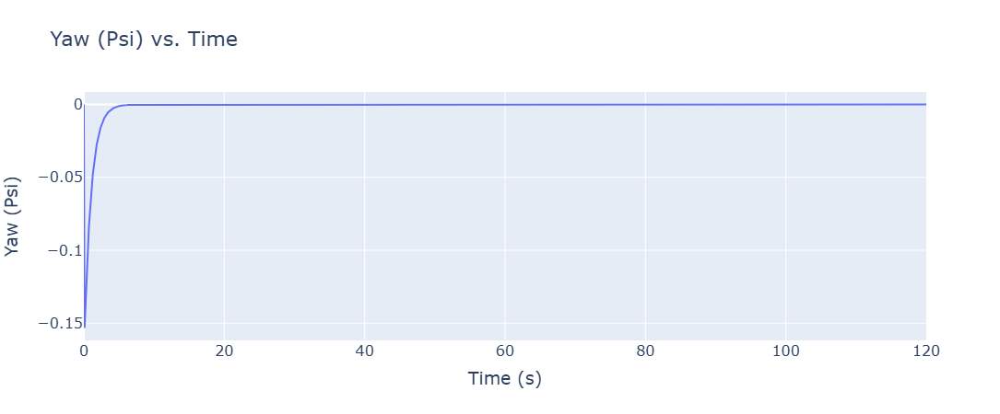

In [15]:
# 3D Trajectory Plot
fig_3d = go.Figure()
fig_3d.add_trace(go.Scatter3d(
    x=x_actual_traj[0],
    y=x_actual_traj[1],
    z=x_actual_traj[2],
    mode='lines',
    line=dict(color='blue', width=4),
    name='3D Trajectory'
))
fig_3d.update_layout(
    title="Drone 3D Trajectory",
    scene=dict(
        xaxis_title="X Position",
        yaxis_title="Y Position",
        zaxis_title="Z Position"
    ),
    font=dict(size=12)  
)
fig_3d.show()

# Time span
time_span = solution['t']

# Function to create and display 2D plots
def plot_2d(title, x_data, y_data, x_label, y_label, name):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=x_data, y=y_data, mode='lines', name=name))
    fig.update_layout(
        title=title,
        xaxis_title=x_label,
        yaxis_title=y_label,
        font=dict(size=16), 
        height=450
    )
    fig.show()

# Create 2D plots
plot_2d("X-Position vs. Time", time_span, x_actual_traj[0], "Time (s)", "X Position", "x(t)")
plot_2d("Y-Position vs. Time", time_span, x_actual_traj[1], "Time (s)", "Y Position", "y(t)")
plot_2d("Z-Position vs. Time", time_span, x_actual_traj[2], "Time (s)", "Z Position", "z(t)")

# Roll, Pitch, and Yaw
phi_traj = x_actual_traj[6]
theta_traj = x_actual_traj[7]
psi_traj = x_actual_traj[8]

plot_2d("Roll (Phi) vs. Time", time_span, phi_traj, "Time (s)", "Roll (Phi)", "Roll (phi)")
plot_2d("Pitch (Theta) vs. Time", time_span, theta_traj, "Time (s)", "Pitch (Theta)", "Pitch (theta)")
plot_2d("Yaw (Psi) vs. Time", time_span, psi_traj, "Time (s)", "Yaw (Psi)", "Yaw (psi)")

#### Test 2

In [16]:
# Initial conditions
initial_conditions = np.array([2,0,1,0,0,0,0,0,0,0,0,0])

# Circle test
def circle(t, x):
    omega = 0.5
    theta = omega*t
    x_des = np.array([[2*np.cos(theta),2*np.sin(theta),1,0,0,0,0,0,0,0,0,9.81*0.695]])
    x_act = (x - x_des).T
    u = -K @ x_act  	# control inputs
    dx_act = A_num@x_act + B_num@u # state-space form
    return dx_act.flatten()

# Time span
t_span = (0, 100) # 1 min 10 sec

# Integrate using solve_ivp
solution = solve_ivp(circle, t_span, initial_conditions, method='RK45', dense_output=False)

# Extract the state vs. time
x_actual_traj = solution.y[:12, :]
x_actual_traj = np.around(x_actual_traj, decimals=4)

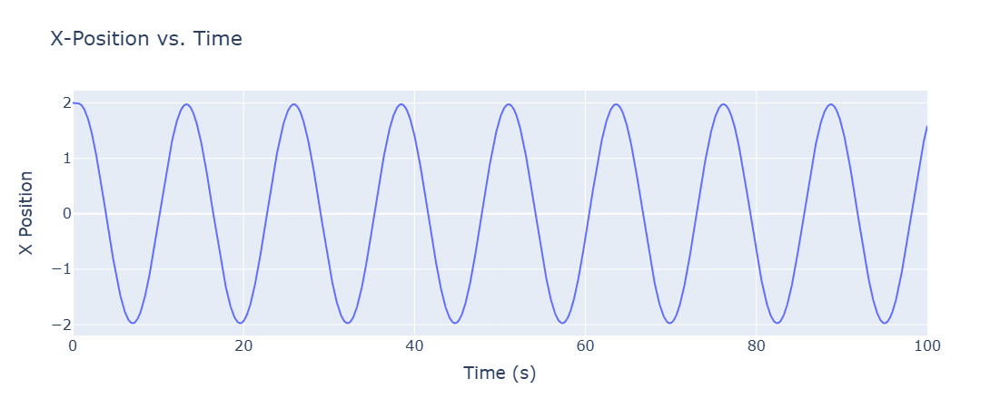

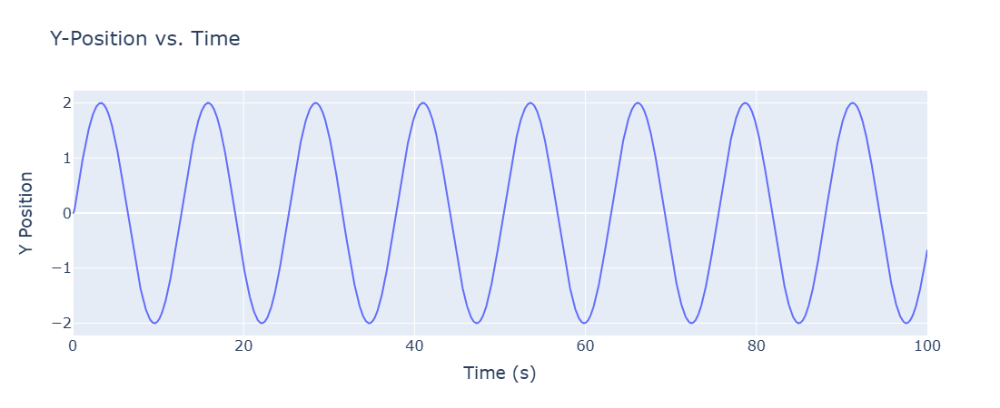

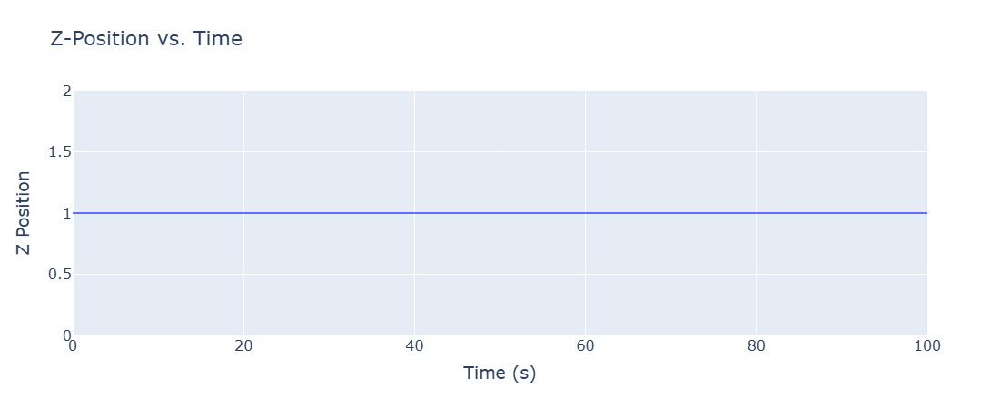

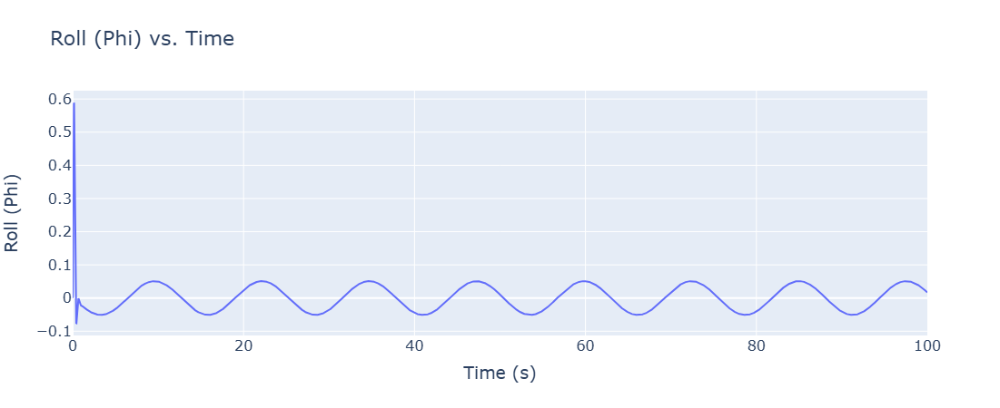

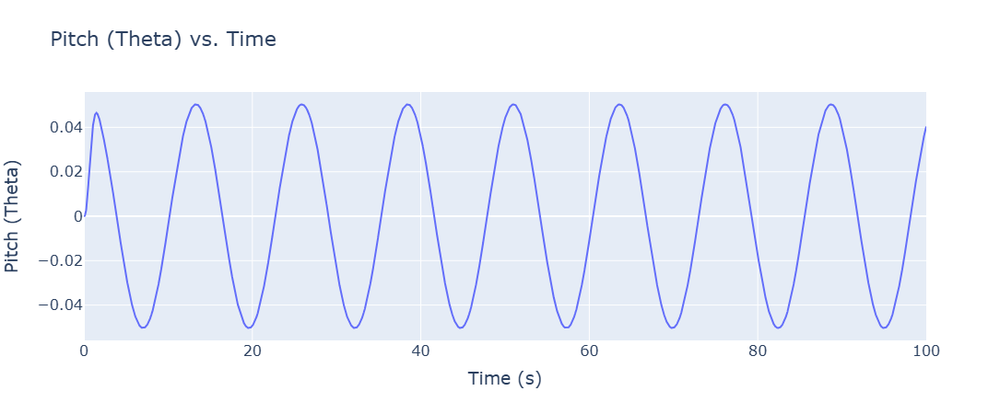

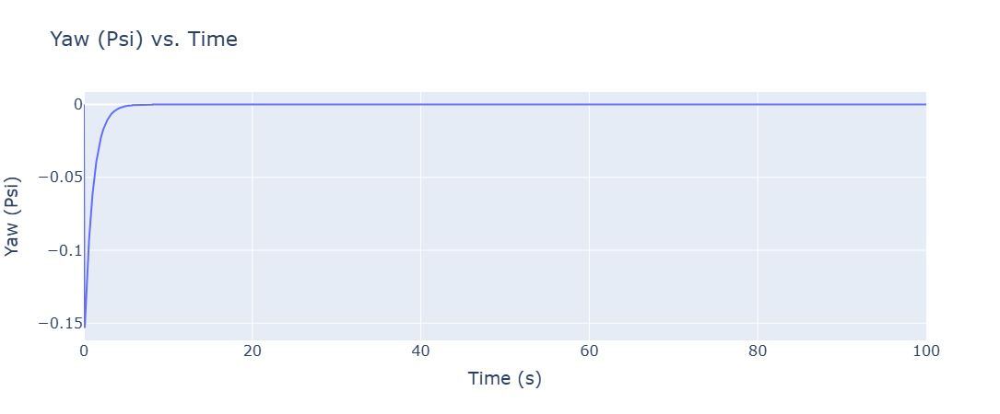

In [17]:
# 3D Trajectory Plot
fig_3d = go.Figure()
fig_3d.add_trace(go.Scatter3d(
    x=x_actual_traj[0],
    y=x_actual_traj[1],
    z=x_actual_traj[2],
    mode='lines',
    line=dict(color='blue', width=4),
    name='3D Trajectory'
))
fig_3d.update_layout(
    title="Drone 3D Trajectory",
    scene=dict(
        xaxis_title="X Position",
        yaxis_title="Y Position",
        zaxis_title="Z Position"
    ),
    font=dict(size=12)  
)
fig_3d.show()

# Time span
time_span = solution['t']

# Function to create and display 2D plots
def plot_2d(title, x_data, y_data, x_label, y_label, name):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=x_data, y=y_data, mode='lines', name=name))
    fig.update_layout(
        title=title,
        xaxis_title=x_label,
        yaxis_title=y_label,
        font=dict(size=16),  
        height=450
    )
    fig.show()

# Create 2D plots
plot_2d("X-Position vs. Time", time_span, x_actual_traj[0], "Time (s)", "X Position", "x(t)")
plot_2d("Y-Position vs. Time", time_span, x_actual_traj[1], "Time (s)", "Y Position", "y(t)")
plot_2d("Z-Position vs. Time", time_span, x_actual_traj[2], "Time (s)", "Z Position", "z(t)")

# Roll, Pitch, and Yaw
phi_traj = x_actual_traj[6]
theta_traj = x_actual_traj[7]
psi_traj = x_actual_traj[8]

plot_2d("Roll (Phi) vs. Time", time_span, phi_traj, "Time (s)", "Roll (Phi)", "Roll (phi)")
plot_2d("Pitch (Theta) vs. Time", time_span, theta_traj, "Time (s)", "Pitch (Theta)", "Pitch (theta)")
plot_2d("Yaw (Psi) vs. Time", time_span, psi_traj, "Time (s)", "Yaw (Psi)", "Yaw (psi)")

#### Performance Goal 3

In [18]:
# Initial conditions
initial_conditions = np.array([2,0,1,0,0,0,0,0,0,0,0,0])

# Circle test
def circle(t, x):
    omega = 0.5
    theta = omega*t
    x_des = np.array([[2*np.cos(theta),2*np.sin(theta),1,0,0,0,0,0,0,0,0,9.81*0.695]])
    x_act = (x - x_des).T
    u = -K @ x_act # control inputs
    dx_act = A_num@x_act + B_num@u # state-space form
    return dx_act.flatten()

# Time span
t_span = (0, 100) # 1 min 10 sec

# Integrate using solve_ivp
solution = solve_ivp(circle, t_span, initial_conditions, method='RK45', dense_output=False)

# Extract the state vs. time
x_actual_traj = solution.y[:12, :]
x_actual_traj = np.around(x_actual_traj, decimals=4)

In [19]:
# Initial conditions
initial_conditions = np.array([0,0,0,0,0,0,0,0,0,0,0,0])

# Trajectory test
def test3(t, x):
    v = 1
    t1 = 0
    t2 = 0
    t3 = 0
    t4 = 0
    t5 = 0
    
    if np.around(x[2], decimals=1) < 1.0 and np.around(x[0], decimals=1) == 0.0 and np.around(x[1], decimals=1) == 0.0:
        x_des = np.array([[0,0,1,0,0,0,0,0,0,0,0,9.81*0.695]])
        t1 = t
    elif t > t1 and t < t1 + 6:
        x_des = np.array([[v*(t-t1),0,1,0,0,0,0,0,0,0,0,9.81*0.695]])
        t2 = t
    elif t > t2 and t < t2 + 1:
        x_des = np.array([[5,0,1,0,0,0,0,0,0,0,0,9.81*0.695]])
        t3 = t
    elif t > t3 and t < t3 + 2:
        x_des = np.array([[5,0,1,0,0,0,np.pi/2,0,0,0,0,9.81*0.695]])
        t4 = t
    elif t > t4 and t < t4 + 6:
        x_des = np.array([[5,5,1,0,0,0,np.pi/2,0,0,0,0,9.81*0.695]])
        t5 = 5
    else:
        x_des = np.array([[5,5,0,0,0,0,np.pi/2,0,0,0,0,9.81*0.695]])

    x_act = (x - x_des).T
    u = -K @ x_act # control inputs
    dx_act = A_num@x_act + B_num@u # state-space form
    return dx_act.flatten()
    
# Time span
t_span = (0, 70)

# Integrate using solve_ivp
solution = solve_ivp(test3, t_span, initial_conditions, method='RK45', dense_output=False)

# Extract the state vs. time
x_actual_traj = solution.y[:12, :]

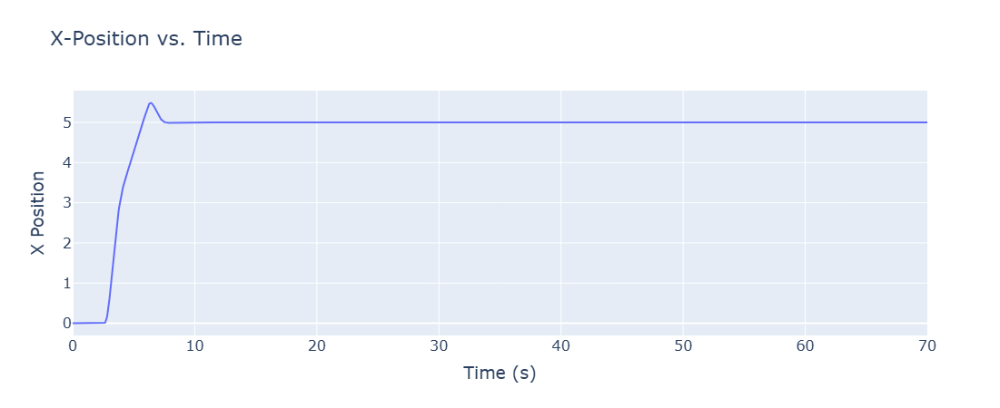

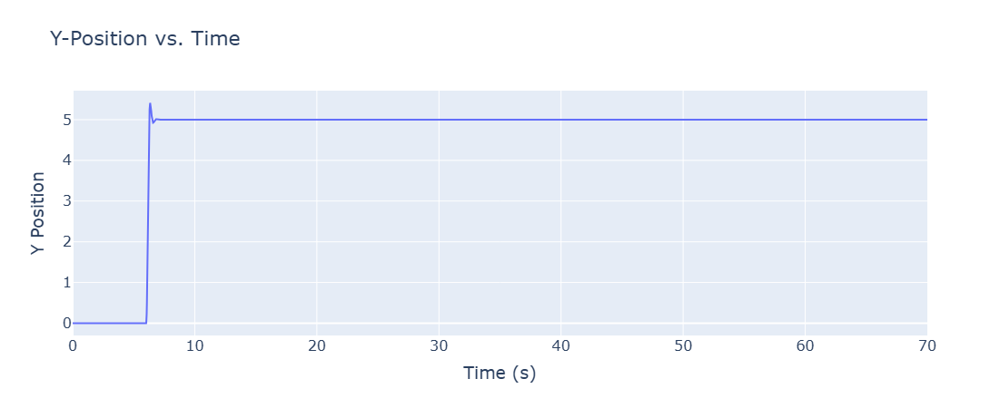

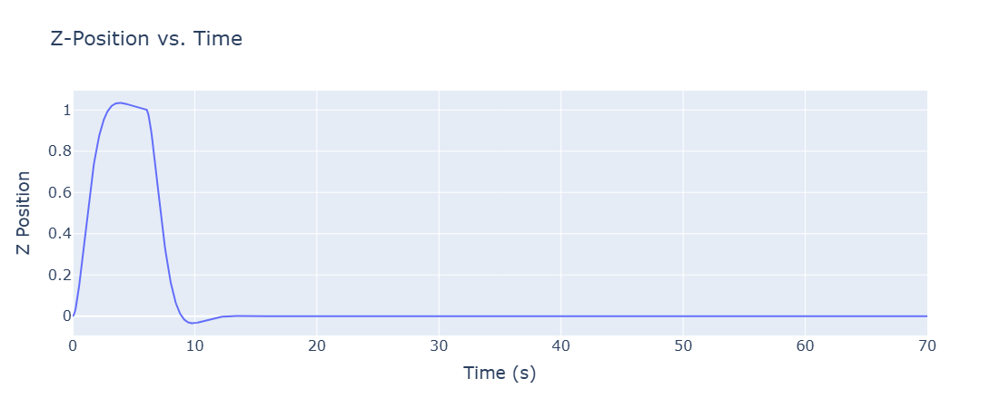

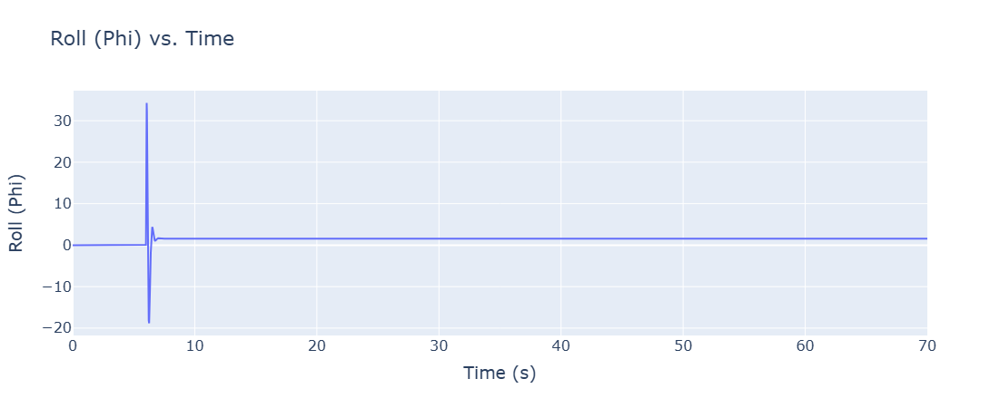

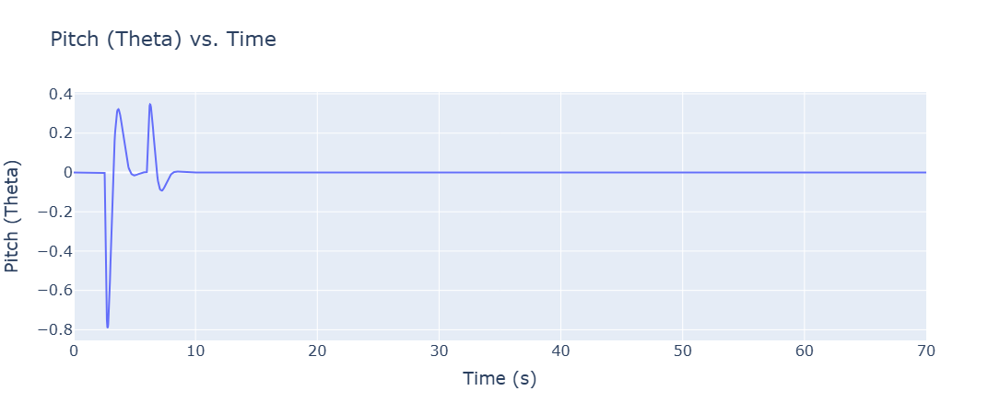

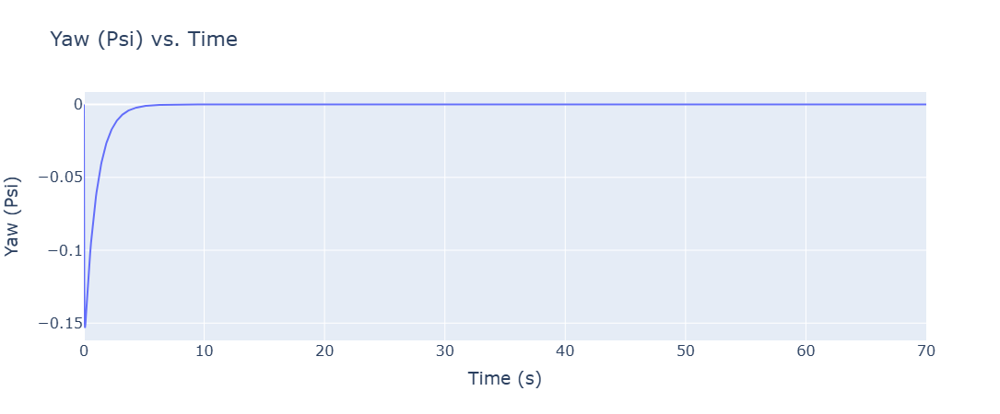

In [20]:
# 3D Trajectory Plot
fig_3d = go.Figure()
fig_3d.add_trace(go.Scatter3d(
    x=x_actual_traj[0],
    y=x_actual_traj[1],
    z=x_actual_traj[2],
    mode='lines',
    line=dict(color='blue', width=4),
    name='3D Trajectory'
))
fig_3d.update_layout(
    title="Drone 3D Trajectory",
    scene=dict(
        xaxis_title="X Position",
        yaxis_title="Y Position",
        zaxis_title="Z Position"
    ),
    font=dict(size=12)  
)
fig_3d.show()

# Time span
time_span = solution['t']

# Function to create and display 2D plots
def plot_2d(title, x_data, y_data, x_label, y_label, name):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=x_data, y=y_data, mode='lines', name=name))
    fig.update_layout(
        title=title,
        xaxis_title=x_label,
        yaxis_title=y_label,
        font=dict(size=16), 
        height=450
    )
    fig.show()

# Create 2D plots
plot_2d("X-Position vs. Time", time_span, x_actual_traj[0], "Time (s)", "X Position", "x(t)")
plot_2d("Y-Position vs. Time", time_span, x_actual_traj[1], "Time (s)", "Y Position", "y(t)")
plot_2d("Z-Position vs. Time", time_span, x_actual_traj[2], "Time (s)", "Z Position", "z(t)")

# Roll, Pitch, and Yaw
phi_traj = x_actual_traj[6]
theta_traj = x_actual_traj[7]
psi_traj = x_actual_traj[8]

plot_2d("Roll (Phi) vs. Time", time_span, phi_traj, "Time (s)", "Roll (Phi)", "Roll (phi)")
plot_2d("Pitch (Theta) vs. Time", time_span, theta_traj, "Time (s)", "Pitch (Theta)", "Pitch (theta)")
plot_2d("Yaw (Psi) vs. Time", time_span, psi_traj, "Time (s)", "Yaw (Psi)", "Yaw (psi)")